# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Get Data

In [2]:
# Read data
df = pd.read_csv(
    filepath_or_buffer="/kaggle/input/ibm-unsupervised-learning-get-data/data.csv",
    index_col='Date',
    parse_dates=['Date']
)

In [3]:
df.head()

,USD/AUD,USD/BRL,USD/CAD,USD/CNY,USD/EUR,USD/INR,USD/IDR,USD/JPY,USD/MXN,USD/ZAR,USD/KRW,USD/GBP,USD/CHF,USD/SEK,USD/NOK,USD/NZD,USD/CZK,USD/HUF,USD/PLN
Date,,,,,,,,,,,,,,,,,,,
2006-07-03 00:00:00+01:00,1.3463,2.1570,1.1116,7.9902,0.78119,45.939999,9050.0,114.750000,11.0770,7.0050,932.690002,0.54277,1.2243,7.1802,6.2313,1.6477,22.155001,218.910004,3.1313
2006-07-04 00:00:00+01:00,1.3444,2.1635,1.1087,7.9823,0.78186,45.900002,8964.0,115.095001,11.0535,6.9875,932.950012,0.54201,1.2240,7.1619,6.2274,1.6420,22.211000,217.910004,3.1253
2006-07-05 00:00:00+01:00,1.3479,2.1885,1.1121,7.9860,0.78530,45.950001,9020.0,115.570000,11.1809,7.2597,940.679993,0.54475,1.2313,7.2121,6.2319,1.6541,22.385000,221.190002,3.1267
2006-07-06 00:00:00+01:00,1.3410,2.1790,1.1125,7.9860,0.78272,45.939999,9020.0,115.260002,11.0230,7.1117,934.919983,0.54422,1.2286,7.1694,6.2242,1.6532,22.280001,219.320007,3.1449
2006-07-07 00:00:00+01:00,1.3298,2.1673,1.1114,7.9755,0.77979,45.785000,8965.0,113.959999,10.9820,7.0438,936.820007,0.54013,1.2238,7.1341,6.2195,1.6361,22.200001,218.199997,3.1012


# EDA and Data Cleaning

### Currency pairs with base currency USD
* There is some dodgy data causing some strange spikes which need to be handled before doing the other plots.
* If the pair goes up, it means that you need more of the quote currency to buy 1 dollar so the quote currency has depreciated against the dollar. If the pair goes down, it means the quote currency has appreciated against the dollar.
* Sometimes the value of a pair goes flat. This means that the quote currency has been pegged to the dollar. Central banks will do this to stabilize the currency. There will still be a tiny amount of volatility because the quote currency is traded in FX markets and so is subject to supply and demand dynamics. The central banks enter these markets to stabilize the currency and maintain the pegged rate.
* Once a currency is pegged, it is not giving us any useful information for HRP (since it has so little volatility vs the dollar). We will therefore drop currencies with any significant period of pegging.

In [4]:
def plot_currency_pairs(df):
    """Function to plot the various currency pairs (all with base currency USD) over time. We will use this before and after
    data cleaning to check the effcct of data cleaning."""
    
    # Number of rows and columns for subplots
    n = len(df.columns)
    ncols = 2
    nrows = n // ncols + (n % ncols > 0) 

    # Set up subplots
    fig, axes = plt.subplots(
        nrows=nrows, 
        ncols=ncols, 
        figsize=(10, 4*nrows))  
    axes = axes.flatten()

    # Plot currency pair
    for ax, column in zip(axes, df.columns):
        # Plot
        df[column].plot(ax=ax)

        # Titles and labels
        ax.set_title(column)
        ax.set_xlabel('Date')
        ax.set_ylabel('Value vs USD')

    # Remove unused subplots
    if len(axes) > n:
        for ax in axes[n:]:
            ax.remove()

    plt.tight_layout() 
    plt.show()

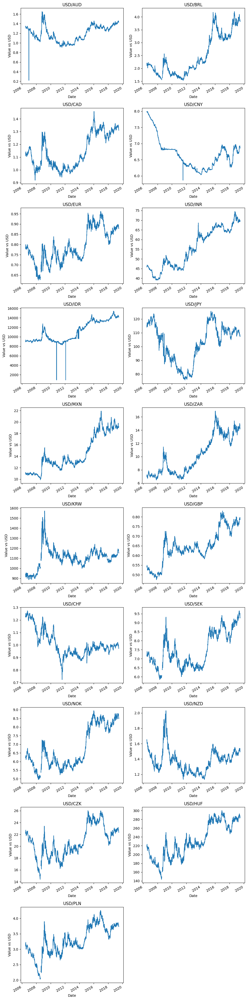

In [5]:
# Plot pairs before cleaning
plot_currency_pairs(df)

In [6]:
# CNY and IDR have sustained periods of pegging so drop these currencies
df.drop(['USD/CNY', 'USD/IDR'], axis=1, inplace=True)

# Towards the end of 2008 many currencies have a large period of missing data so we will start data from 2009.
df = df.truncate(before=pd.Timestamp('2009-01-01', tz='US/Eastern'))

# Forward fill any remaining nans
df.ffill(inplace=True)

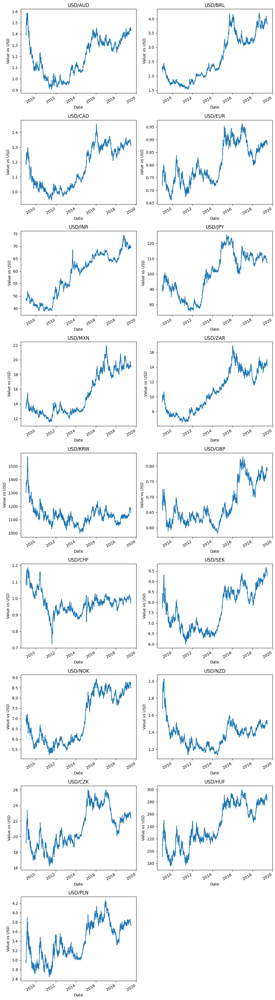

In [7]:
# Plot pairs after data cleaning
plot_currency_pairs(df)

### Cumulative Returns

Text(0.5, 1.0, 'Cumulative Returns when selling currency pairs')

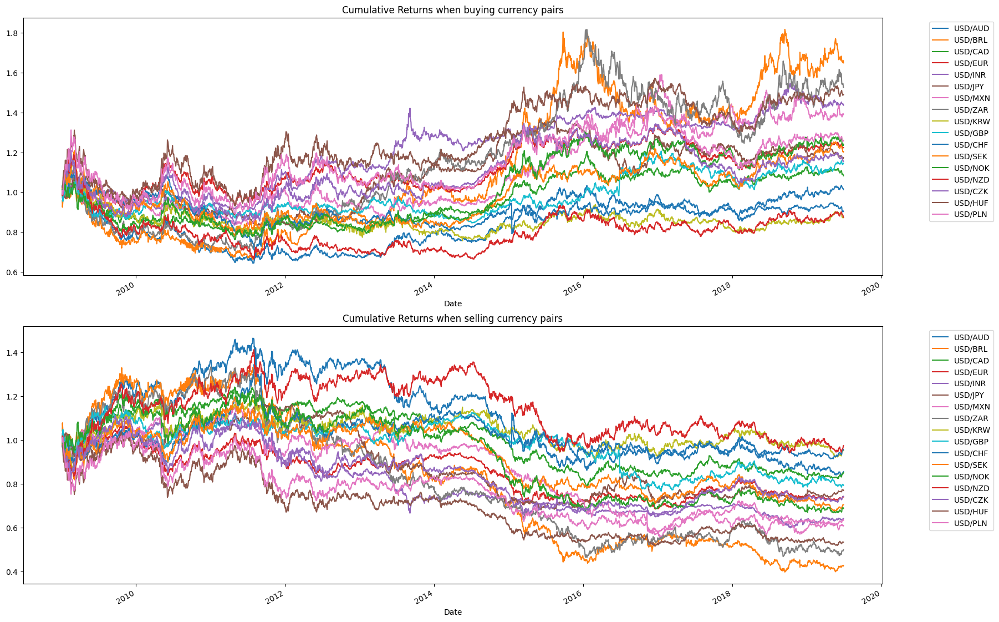

In [8]:
# Calculate returns when buying the currency pair (if you think base currency will appreciate vs quote currency)
returns_buy_pair = df.pct_change()

# Calculate returns when selling the currency pair (if you think base currency will depreciate vs quote currency)
returns_sell_pair = -df.pct_change()

# Calculate cumulative returns in each case
cumulative_returns_buy_pair = (1 + returns_buy_pair).cumprod()
cumulative_returns_sell_pair = (1 + returns_sell_pair).cumprod()

# Plot cumulative returns in each case
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20, 15))
cumulative_returns_buy_pair.plot(ax=axes[0]) 
cumulative_returns_sell_pair.plot(ax=axes[1])
axes[0].legend(loc='upper left', bbox_to_anchor=(1.05, 1))
axes[1].legend(loc='upper left', bbox_to_anchor=(1.05, 1))
axes[0].set_title(f"Cumulative Returns when buying currency pairs")
axes[1].set_title(f"Cumulative Returns when selling currency pairs")

### Annualized Volatility

<Figure size 2000x800 with 0 Axes>

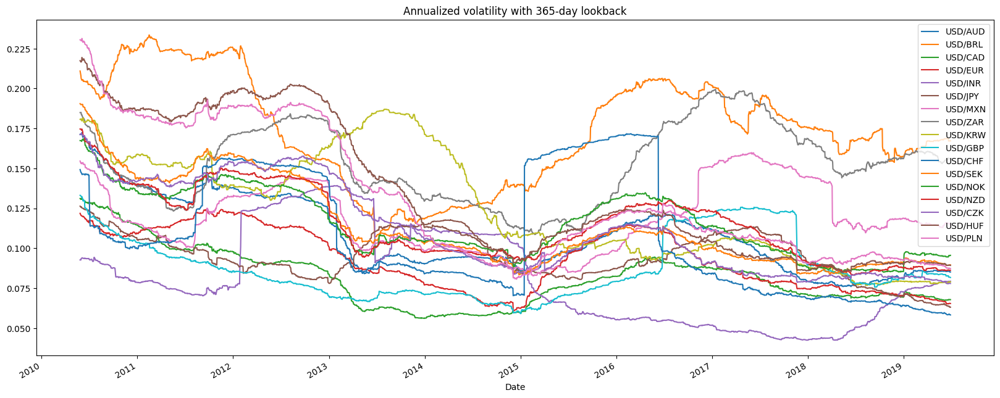

In [9]:
# Lookback period
window = 365

# Calculate returns (assuming buying pair)
returns = df.pct_change()

# Calculate annualized vol
vol = returns.rolling(window).std() * np.sqrt(252)

# Plot
plt.figure(figsize=(20, 8))
vol.plot(figsize=(20, 8))
plt.title(f"Annualized volatility with {window}-day lookback")
plt.show()

### Correlation Matrix

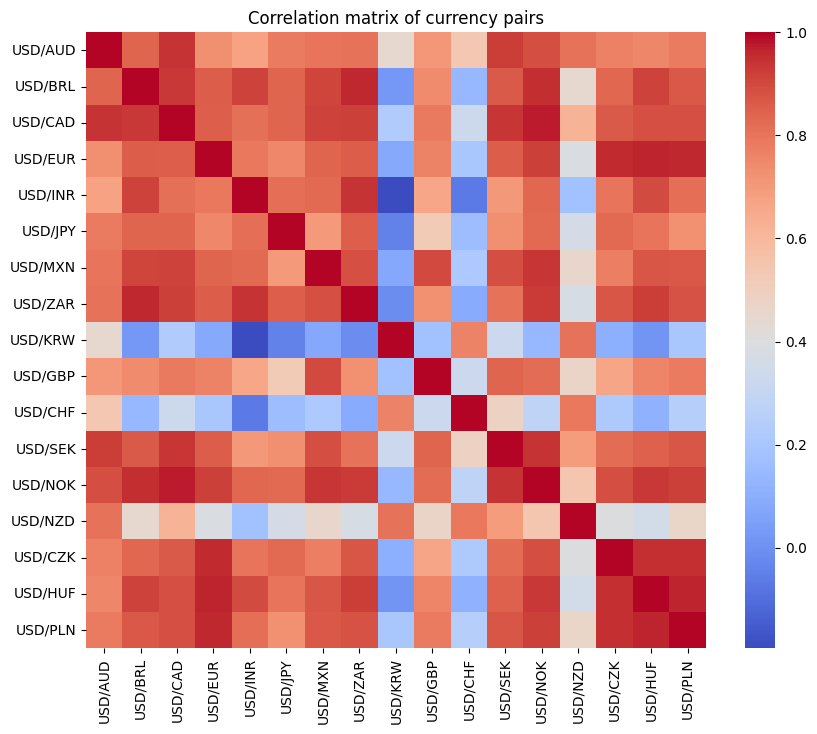

In [10]:
# Calculate correlation matrix over whole time period
correlation_matrix = df.corr()

# Plot heatmap of correlation matrix]
plt.figure(figsize=(10, 8))
sns.heatmap(
    data=correlation_matrix,
    cmap='coolwarm'
)
plt.title("Correlation matrix of currency pairs")
plt.show()

### Correlation Over Time

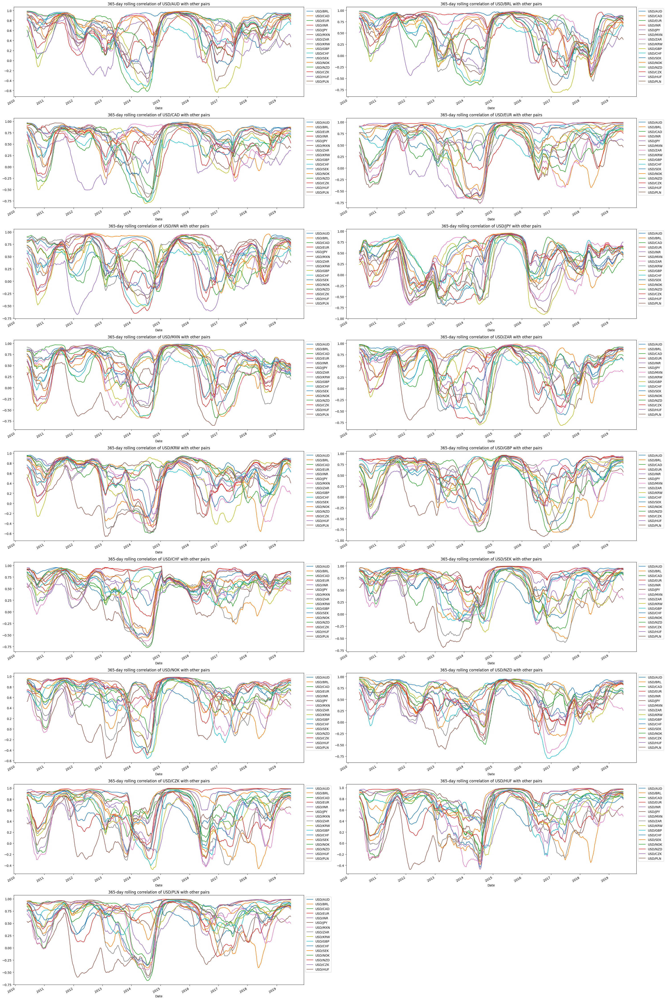

In [11]:
# Lookback period
window = 365

# Number of columns
n = len(df.columns)

# Calculate the number of rows needed for the subplots with 2 columns
rows = np.ceil(n / 2).astype(int)

# Set up figure
fig, axes = plt.subplots(rows, 2, figsize=(30, 5*rows))

# Flatten the axes array in case n is not exactly divisible by 2
axes = axes.flatten()

# Compute the rolling correlation for each pair with all other pairs
for i, col1 in enumerate(df.columns):
    rolling_corr = pd.DataFrame()
    for col2 in df.columns:
        if col1 != col2:
            rolling_corr[col2] = df[col1].rolling(window).corr(df[col2])

    # Plot the rolling correlations for this column
    rolling_corr.plot(ax=axes[i], title=f'{window}-day rolling correlation of {col1} with other pairs')
    axes[i].legend(loc='upper left', bbox_to_anchor=(1, 1))

# Remove any unused subplots
if n % 2 != 0:
    fig.delaxes(axes[-1])

# Display figure
plt.tight_layout()
plt.show()

# Write Output

In [12]:
# Write to file
df.to_csv(path_or_buf="data.csv")